In [ ]:
!pip install tensorflow-addons

In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
from pathlib import Path
from tqdm import tqdm
import skimage.io
import matplotlib.pyplot as plt
import sys, os, random, glob, cv2, math
import logging
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
logging.getLogger('tensorflow').setLevel(logging.ERROR)
import tensorflow as tf
tf.config.optimizer.set_jit(False)  

In [ ]:
import os
import numpy as np
import tensorflow as tf
import scipy.io as sio
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Layer, Input, Conv2D, Activation, Concatenate, BatchNormalization, Conv2DTranspose, UpSampling2D, multiply, Add, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

tf.config.optimizer.set_jit(False)  # Disable XLA

class ResizeTensor(Layer):
    def call(self, inputs):
        x, ref = inputs
        new_size = [tf.shape(ref)[1], tf.shape(ref)[2]]
        return tf.image.resize(x, new_size, method="bilinear")

    def compute_output_shape(self, input_shape):
        ref_shape = input_shape[1]
        return (ref_shape[0], ref_shape[1], ref_shape[2], input_shape[0][3])

    def get_config(self):
        return super(ResizeTensor, self).get_config()

def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])  # Ensure all images are resized to 224x224
    return image / 255.0

def preprocess_mat_label(label_path, num_classes):
    label_path = label_path.numpy().decode('utf-8')
    label = sio.loadmat(label_path)
    inst_map = label['inst_map']
    inst_map_tensor = tf.convert_to_tensor(inst_map, dtype=tf.int32)
    one_hot_labels = tf.one_hot(inst_map_tensor, depth=num_classes)
    resized_labels = tf.image.resize(one_hot_labels, [224, 224], method='nearest')  # Resize labels to 224x224 to match image sizes
    return resized_labels

def load_and_preprocess_from_path_label(image_path, label_path, num_classes):
    image = preprocess_image(image_path)
    label = tf.py_function(func=preprocess_mat_label, inp=[label_path, num_classes], Tout=tf.float32)
    label.set_shape([224, 224, num_classes])
    return image, label

def create_dataset(img_folders, ann_folder, batch_size, num_classes, split='train', test_size=0.2):
    img_paths = []
    for folder in img_folders:
        img_paths.extend([os.path.join(folder, fname) for fname in sorted(os.listdir(folder)) if fname.lower().endswith(('.png', '.jpg', '.jpeg'))])
    ann_paths = [os.path.join(ann_folder, fname) for fname in sorted(os.listdir(ann_folder)) if fname.lower().endswith('.mat')]

    if len(ann_paths) == 0:
        raise Exception("No annotation files found. Check the directory and file extensions.")

    train_img_paths, valid_img_paths, train_ann_paths, valid_ann_paths = train_test_split(img_paths, ann_paths, test_size=test_size, random_state=42)
    
    dataset = tf.data.Dataset.from_tensor_slices((train_img_paths if split == 'train' else valid_img_paths, train_ann_paths if split == 'train' else valid_ann_paths))
    dataset = dataset.map(lambda img_path, label_path: load_and_preprocess_from_path_label(img_path, label_path, num_classes), num_parallel_calls=tf.data.AUTOTUNE)
    return dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

img_folders = ['/kaggle/input/lizard-dataset/lizard_images1/Lizard_Images1', '/kaggle/input/lizard-dataset/lizard_images2/Lizard_Images2']
ann_folder = '/kaggle/input/lizard-dataset/lizard_labels/Lizard_Labels/Labels'
num_classes = 6
batch_size = 32
train_dataset = create_dataset(img_folders, ann_folder, batch_size, num_classes, 'train')
valid_dataset = create_dataset(img_folders, ann_folder, batch_size, num_classes, 'valid')

def build_model(input_shape, num_classes):
    inputs = Input(input_shape)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    outputs = Conv2D(num_classes, (1, 1), padding="same", activation="softmax")(x)
    model = Model(inputs, outputs, name="Multi-Class-CNN")
    return model

model = build_model((224, 224, 3), num_classes)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

callbacks = [
    ModelCheckpoint("best_model.keras", save_best_only=True, monitor='val_loss' )
]
#save_weights_only=True

history = model.fit(train_dataset, validation_data=valid_dataset, epochs=20, callbacks=callbacks)

def plot_training_history(history):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title('Loss Over Epochs')
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend()
    plt.title('Accuracy Over Epochs')
    plt.show()

plot_training_history(history)


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import tensorflow as tf
from skimage.measure import label, regionprops
import networkx as nx
from tensorflow.keras.models import load_model
import scipy.io as sio

tf.config.optimizer.set_jit(False)  # Ensure compatibility

# Ensure images and labels are resized and processed consistently
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])
    return image / 255.0

def preprocess_mat_label(label_path, num_classes):
    label_path = label_path.numpy().decode('utf-8')
    label = sio.loadmat(label_path)
    inst_map = label['inst_map']
    inst_map_tensor = tf.convert_to_tensor(inst_map, dtype=tf.int32)
    one_hot_labels = tf.one_hot(inst_map_tensor, depth=num_classes)
    resized_labels = tf.image.resize(one_hot_labels, [224, 224], method='nearest')
    return resized_labels

def load_and_preprocess_from_path_label(image_path, label_path, num_classes):
    image = preprocess_image(image_path)
    label = tf.py_function(func=preprocess_mat_label, inp=[label_path, num_classes], Tout=tf.float32)
    label.set_shape([224, 224, num_classes])
    return image, label

# Load the model
def load_model_custom(model_path):
    # Ensure that custom objects, if any, are correctly referenced here
    model = load_model(model_path)
    return model

# Prediction and feature extraction functions
def predict_mask(model, image):
    prediction = model.predict(np.expand_dims(image, axis=0))
    return prediction.squeeze()

def extract_features(mask):
    labeled_mask = label(mask)
    properties = regionprops(labeled_mask)
    features = [{'area': prop.area, 'centroid': prop.centroid, 'bbox': prop.bbox, 'label': prop.label} for prop in properties]
    return features, labeled_mask

def build_graph(features):
    G = nx.Graph()
    for feature in features:
        G.add_node(feature['label'], size=feature['area'], centroid=feature['centroid'])
        for other_feature in features:
            if feature['label'] != other_feature['label']:
                distance = np.linalg.norm(np.array(feature['centroid']) - np.array(other_feature['centroid']))
                if distance < 100:  # Connection threshold
                    G.add_edge(feature['label'], other_feature['label'], weight=distance)
    return G

def visualize_graph_on_image(image, graph, title='Graph on Image'):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(image, cmap='gray')
    pos = {node: (data['centroid'][1], data['centroid'][0]) for node, data in graph.nodes(data=True)}
    nx.draw(graph, pos, node_color='red', edge_color='blue', ax=ax)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Example of using these functions in your pipeline
image_path = '/kaggle/input/lizard-dataset/lizard_images1/Lizard_Images1/consep_1.png'  # Adjust path as necessary
model_path = '/kaggle/input/kersas/best_model (2).keras'  # Adjust path as necessary
image = preprocess_image(image_path)
model = load_model_custom(model_path)
mask = predict_mask(model, image)
features, labeled_mask = extract_features(mask)
graph = build_graph(features)
visualize_graph_on_image(image, graph)


In [1]:
import os
import numpy as np
import matplotlib.colors as mcolors
import tensorflow as tf
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
from skimage.color import label2rgb
import networkx as nx
import scipy.io as sio  # Ensure scipy is imported

# Function to preprocess the image
def preprocess_image(image_path, target_size=(500, 500)):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, target_size)  # Resize image to match target size
    return image / 255.0  # Normalize pixel values

# Function to load and preprocess the label from the Lizard dataset
def load_lizard_label(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)

    # Load the instance segmentation map and resize it to match the image size
    inst_map = label['inst_map']
    inst_map_expanded = np.expand_dims(inst_map, axis=-1)  # Expand dimensions to [H, W, 1]
    inst_map_resized = tf.image.resize(tf.convert_to_tensor(inst_map_expanded, dtype=tf.float32), target_size, method='nearest').numpy()

    # Load the index array
    nuclei_id = label['id']  # shape (N, 1)
    nuclei_id = np.squeeze(nuclei_id).tolist()

    # Load the nuclear categories / classes
    classes = label['class']

    # Load the bounding boxes
    bboxs = label['bbox']

    # Load the centroids
    centroids = label['centroid']

    # Match each nucleus with its corresponding class, bbox, and centroid
    features = []
    unique_values = np.unique(inst_map).tolist()[1:]  # Remove 0 (background)

    for value in unique_values:
        # Get the position of the corresponding value
        idx = nuclei_id.index(value)
        feature = {
            'class': classes[idx],
            'bbox': bboxs[idx],
            'centroid': centroids[idx]  # Use original centroid without scaling yet
        }
        features.append(feature)

    return inst_map_resized.squeeze(), features  # Remove the extra channel added earlier

# Build graph based on centroids of nuclei
def build_graph(features):
    G = nx.Graph()
    for idx, feature in enumerate(features):
        G.add_node(idx, size=feature['bbox'], centroid=feature['centroid'], class_=feature['class'])

        for other_idx, other_feature in enumerate(features):
            if idx != other_idx:
                distance = np.linalg.norm(np.array(feature['centroid']) - np.array(other_feature['centroid']))
                if distance < 50:  # Adjust threshold as needed
                    G.add_edge(idx, other_idx, weight=distance)

    return G

# Visualize the graph overlaid on the image and the segmentation
def visualize_graph_on_image(image, graph, inst_map, features, title='Graph on Image'):
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Convert the image tensor back to NumPy array for matplotlib
    image_np = image.numpy()

    # Display the original RGB image
    ax.imshow(image_np, interpolation='nearest')

    # Ensure the inst_map and image have the same dimensions
    if inst_map.shape[:2] == image_np.shape[:2]:
        color_tuples = [mcolors.to_rgb(color) for color in mcolors.TABLEAU_COLORS.values()]
        labeled_overlay = label2rgb(inst_map.astype(int), image=image_np, alpha=0.5, bg_label=0, colors=color_tuples)
        ax.imshow(labeled_overlay, interpolation='nearest')

        # Plot the centroids of each nucleus and color the nodes by their class
        for idx, feature in enumerate(features):
            centroid = feature['centroid']
            node_class = feature['class'][0]  # Get the class for this node
            # Map class to a color (assuming classes are 1-indexed and we have sufficient colors)
            color = color_tuples[(node_class - 1) % len(color_tuples)]
            ax.scatter(centroid[0], centroid[1], s=100, edgecolors='black', facecolors=color, label=f'Class {node_class}')  # Flip x and y correctly

        # Draw graph nodes and edges, color nodes based on class
        pos = {node: np.array(data['centroid']) for node, data in graph.nodes(data=True)}  # Don't flip now
        node_colors = [color_tuples[(data['class_'][0] - 1) % len(color_tuples)] for node, data in graph.nodes(data=True)]
        nx.draw(graph, pos, node_color=node_colors, with_labels=False, node_size=50, ax=ax, edge_color='blue')

    else:
        print("Error: Image and inst_map shapes do not match")

    plt.title(title)
    plt.axis('off')
    plt.show()

# Example usage
image_path = '/kaggle/input/lizard-dataset/lizard_images1/Lizard_Images1/consep_4.png'  # Path to the uploaded image
label_path = '/kaggle/input/lizard-dataset/lizard_labels/Lizard_Labels/Labels/consep_4.mat'  # Adjust this path accordingly

# Preprocess the image
image = preprocess_image(image_path)

# Load the label, instance map, and features
inst_map_resized, features = load_lizard_label(label_path)

# Build the graph based on the features
graph = build_graph(features)

# Visualize the graph on top of the original image
visualize_graph_on_image(image, graph, inst_map_resized, features)


NotFoundError: {{function_node __wrapped__ReadFile_device_/job:localhost/replica:0/task:0/device:CPU:0}} /kaggle/input/lizard-dataset/lizard_images1/Lizard_Images1/consep_4.png; No such file or directory [Op:ReadFile]

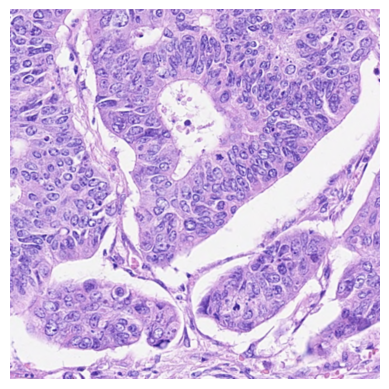

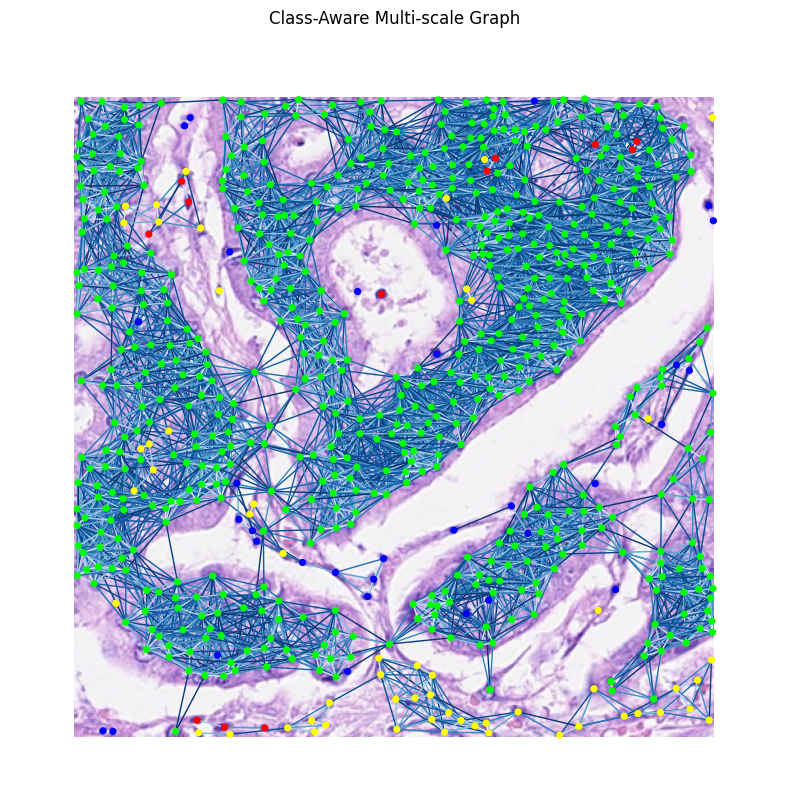

In [4]:
import os
import numpy as np
import matplotlib.colors as mcolors
import tensorflow as tf
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
from skimage.color import label2rgb
import networkx as nx
import scipy.io as sio  # Ensure scipy is imported

# Define specific colors for each class
# Define specific colors for each class
class_colors = {
    1: (0.0, 0.0, 1.0),   # Blue for Plasma
    3: (0.0, 1.0, 0.0),   # Green for Lymphocyte
    2: (1.0, 0.0, 0.0),   # Red for Epithelial
    4: (1.0, 1.0, 0.0),   # Yellow for Neutrophil
    5: (1.0, 0.0, 1.0),   # Magenta for Eosinophil
    6: (0.0, 1.0, 1.0)    # Cyan for Connective (other)
}

# Mapping class labels to their names
class_names = {
    1: 'Miscellaneous',
    2: 'Inflammatory',
    3: 'Connective tissue',
    4: 'Neoplastic epithelial',
    5: 'Spindle-shaped',
    6: 'Epithelial (Other)'
}

# Function to preprocess the image
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Ensure channels=3 for RGB
    image = tf.image.resize(image, [500, 500])  # Resize image to 500x500
    image = tf.cast(image, tf.float32)  # Cast to float32 before division
    image = image / 255.0  # Normalize the image to [0, 1]
    return image

# Function to load and preprocess the label from the CoNSeP dataset
def load_lizard_label(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)

    # Load the instance segmentation map and resize it to match the image size
    inst_map = label['inst_map']
    inst_map_expanded = np.expand_dims(inst_map, axis=-1)
    inst_map_resized = tf.image.resize(tf.convert_to_tensor(inst_map_expanded, dtype=tf.float32), target_size, method='nearest').numpy()

    # Extract structures from CoNSeP mat file
    inst_type = label['inst_type'].flatten()
    centroids = label['inst_centroid']
    # Scale centroids from 1000x1000 to 500x500
    scale_factor_x = target_size[1] / inst_map.shape[1]
    scale_factor_y = target_size[0] / inst_map.shape[0]
    centroids = centroids * [scale_factor_x, scale_factor_y]
    
    # Check if 'bbox' exists
    has_bbox = 'bbox' in label
    bboxs = label['bbox'] if has_bbox else None

    # Prepare features
    features = []
    unique_values = np.unique(inst_map).tolist()[1:]  # Remove background

    for idx, value in enumerate(unique_values):
        feature = {
            'class': [int(inst_type[idx])],
            'centroid': centroids[idx],
            'bbox': bboxs[idx] if has_bbox else None
        }
        features.append(feature)

    return inst_map_resized.squeeze(), features

# Build graph based on centroids of nuclei and class/color
def build_class_aware_graph(features, distance_threshold):
    G = nx.Graph()

    for idx, feature in enumerate(features):
        class_label = feature['class'][0]  # Get the class number
        color = class_colors.get(class_label, (1.0, 1.0, 1.0))  # Default to white if class not found
        G.add_node(idx, size=feature['bbox'], centroid=feature['centroid'], class_=class_label, color=color)

        # Create edges only between nodes of the same class and within the distance threshold
        for other_idx, other_feature in enumerate(features):
            if idx != other_idx and feature['class'] == other_feature['class']:
                distance = np.linalg.norm(np.array(feature['centroid']) - np.array(other_feature['centroid']))
                if distance < distance_threshold:
                    G.add_edge(idx, other_idx, weight=distance)

    return G

# Visualize the graph overlaid on the image and the segmentation
def visualize_class_aware_graph(image, graph, inst_map, features, title='Class-Aware Multi-scale Graph'):
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Convert tensor to numpy array directly and display
    image_np = image.numpy()
    
    # Show the original color image
    ax.imshow(image_np)

    # Adjust node positions to correct for 90-degree rotation
    pos = {node: (data['centroid'][0], data['centroid'][1]) for node, data in graph.nodes(data=True)}

    # Draw graph nodes and edges with correct scaling
    edge_colors = [graph.edges[edge]['weight'] for edge in graph.edges()]
    nx.draw(graph, pos, with_labels=False, node_size=10, node_color=[data['color'] for _, data in graph.nodes(data=True)],
            ax=ax, edge_color=edge_colors, edge_cmap=plt.cm.Blues, linewidths=2)

    plt.title(title)
    plt.axis('off')
    plt.show()


# Adjust these paths for your setup (example from CoNSeP dataset)
image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_14.png'
label_path = '/kaggle/input/output2/mat/test_14.mat'

# Show raw image
raw_image = tf.io.read_file(image_path)
raw_image = tf.image.decode_jpeg(raw_image, channels=3)
plt.imshow(raw_image.numpy())
plt.axis('off')
plt.show()

# Preprocess the image
image = preprocess_image(image_path)

# Load the label, instance map, and features
inst_map_resized, features = load_lizard_label(label_path)

# Define distance threshold
distance_threshold = 50

# Build the graph based on the features and class
graph = build_class_aware_graph(features, distance_threshold)

# Visualize the class-aware graph on top of the image
visualize_class_aware_graph(image, graph, inst_map_resized, features)


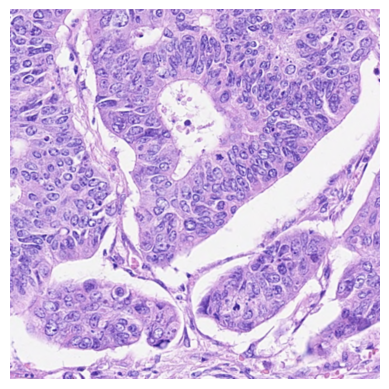

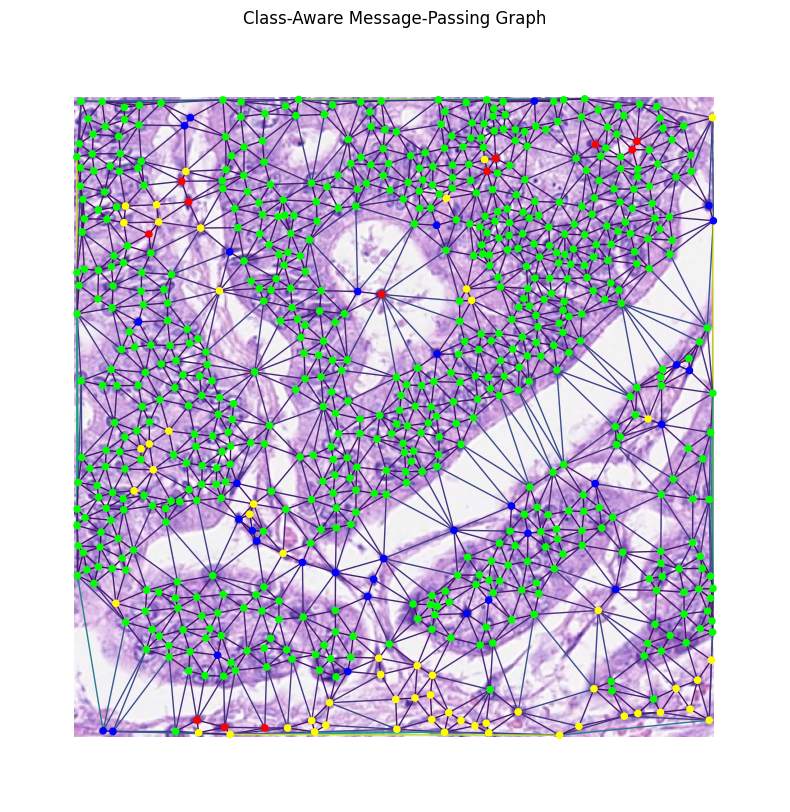

In [7]:
import os
import numpy as np
import matplotlib.colors as mcolors
import tensorflow as tf
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
from skimage.color import label2rgb
import networkx as nx
import scipy.io as sio
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import Delaunay


# Define specific colors for each class
# Define specific colors for each class
class_colors = {
    1: (0.0, 0.0, 1.0),   # Blue for Plasma
    3: (0.0, 1.0, 0.0),   # Green for Lymphocyte
    2: (1.0, 0.0, 0.0),   # Red for Epithelial
    4: (1.0, 1.0, 0.0),   # Yellow for Neutrophil
    5: (1.0, 0.0, 1.0),   # Magenta for Eosinophil
    6: (0.0, 1.0, 1.0)    # Cyan for Connective (other)
}

# Mapping class labels to their names
class_names = {
    1: 'Miscellaneous',
    2: 'Inflammatory',
    3: 'Connective tissue',
    4: 'Neoplastic epithelial',
    5: 'Spindle-shaped',
    6: 'Epithelial (Other)'
}

# Function to preprocess the image
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Ensure channels=3 for RGB
    image = tf.image.resize(image, [500, 500])  # Resize image to 500x500
    image = tf.cast(image, tf.float32)  # Cast to float32 before division
    image = image / 255.0  # Normalize the image to [0, 1]
    return image

# Function to load and preprocess the label from the CoNSeP dataset
def load_lizard_label(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)

    # Load the instance segmentation map and resize it to match the image size
    inst_map = label['inst_map']
    inst_map_expanded = np.expand_dims(inst_map, axis=-1)
    inst_map_resized = tf.image.resize(tf.convert_to_tensor(inst_map_expanded, dtype=tf.float32), target_size, method='nearest').numpy()

    # Load and scale centroids
    centroids = label['inst_centroid']
    scale_factor_x = target_size[1] / inst_map.shape[1]
    scale_factor_y = target_size[0] / inst_map.shape[0]
    centroids = centroids * [scale_factor_x, scale_factor_y]

    # Load classes (types) for each instance
    classes = label['inst_type'].flatten()

    # Handle optional bbox
    has_bbox = 'bbox' in label
    bboxs = label['bbox'] if has_bbox else [None] * len(classes)

    # Build features list
    features = []
    unique_values = np.unique(inst_map).tolist()[1:]  # Exclude background

    for idx, value in enumerate(unique_values):
        feature = {
            'class': [int(classes[idx])],
            'bbox': bboxs[idx] if has_bbox else None,
            'centroid': centroids[idx]
        }
        features.append(feature)

    return inst_map_resized.squeeze(), features

# Build message passing graph based on centroids of nuclei and class/color using Nearest Neighbors
def build_message_passing_graph(features, num_neighbors=4, use_delaunay=True):
    G = nx.Graph()

    # Extract centroids for all nodes
    centroids = np.array([feature['centroid'] for feature in features])

    # Always add all nodes
    for idx, feature in enumerate(features):
        class_label = feature['class'][0]
        color = class_colors.get(class_label, (1.0, 1.0, 1.0))
        G.add_node(idx, size=feature['bbox'], centroid=feature['centroid'], class_=class_label, color=color)

    if use_delaunay:
        # Delaunay triangulation for edges
        tri = Delaunay(centroids)
        for simplex in tri.simplices:
            for i in range(3):
                idx1 = simplex[i]
                idx2 = simplex[(i + 1) % 3]
                distance = np.linalg.norm(centroids[idx1] - centroids[idx2])
                G.add_edge(idx1, idx2, weight=distance)
    else:
        # Default: k-Nearest Neighbors for edges
        nbrs = NearestNeighbors(n_neighbors=num_neighbors + 1).fit(centroids)
        distances, indices = nbrs.kneighbors(centroids)
        for idx, feature in enumerate(features):
            for neighbor_idx in indices[idx][1:]:  # Skip the first neighbor (itself)
                distance = distances[idx][indices[idx].tolist().index(neighbor_idx)]
                G.add_edge(idx, neighbor_idx, weight=distance)
    return G

# Visualize the graph overlaid on the image and the segmentation
def visualize_class_aware_graph(image, graph, inst_map, features, title='Class-Aware Message-Passing Graph'):
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Convert the image tensor to a numpy array
    image_np = image.numpy()
    
    # Display the image
    ax.imshow(image_np)

    # Correctly map x and y without swapping them (maintaining their original positions)
    pos = {node: (data['centroid'][0], data['centroid'][1]) for node, data in graph.nodes(data=True)}

    # Draw the nodes
    node_colors = [data['color'] for _, data in graph.nodes(data=True)]
    nx.draw_networkx_nodes(graph, pos, node_size=20, node_color=node_colors, ax=ax)

    # Draw the edges
    edge_weights = np.array([graph.edges[edge]['weight'] for edge in graph.edges()])
    edge_colors = edge_weights  # Map edge weights to colors in a colormap
    edge_alphas = edge_weights / max(edge_weights)  # Normalize for alpha values
    nx.draw_networkx_edges(graph, pos, ax=ax, edge_color=edge_colors, style='solid', alpha=1, width=1)

    plt.title(title)
    plt.axis('off')
    plt.show()

# Show the original raw image
image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_14.png'  # Adjust this path
raw_image = tf.io.read_file(image_path)
raw_image = tf.image.decode_jpeg(raw_image, channels=3)
plt.imshow(raw_image.numpy())
plt.axis('off')
plt.show()
    
# Example usage
image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_14.png'
label_path = '/kaggle/input/output2/mat/test_14.mat'

# Preprocess the image
image = preprocess_image(image_path)

# Load the label, instance map, and features
inst_map_resized, features = load_lizard_label(label_path)

# Define number of neighbors for message passing
num_neighbors = 4

# Build the message-passing graph based on the nearest neighbors
graph = build_message_passing_graph(features, num_neighbors)

# Visualize the message-passing graph on top of the image
visualize_class_aware_graph(image, graph, inst_map_resized, features)
## delaunay only#

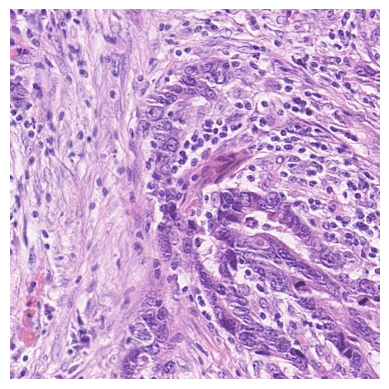

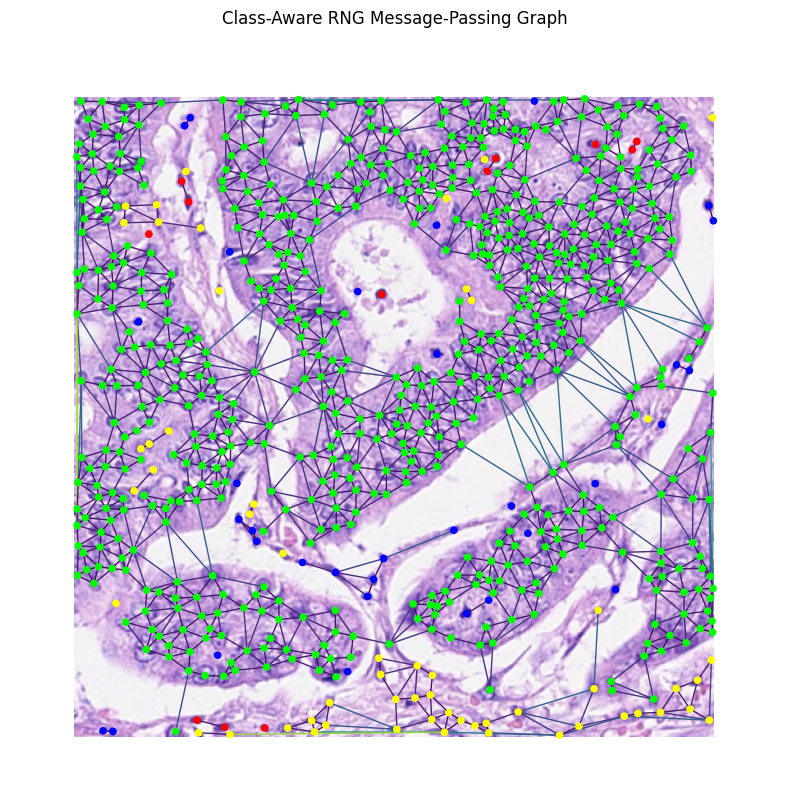

In [5]:
import os
import numpy as np
import matplotlib.colors as mcolors
import tensorflow as tf
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
from skimage.color import label2rgb
import networkx as nx
import scipy.io as sio
from scipy.spatial import Delaunay

# Define specific colors for each class
# Define specific colors for each class
class_colors = {
    1: (0.0, 0.0, 1.0),   # Blue for Plasma
    3: (0.0, 1.0, 0.0),   # Green for Lymphocyte
    2: (1.0, 0.0, 0.0),   # Red for Epithelial
    4: (1.0, 1.0, 0.0),   # Yellow for Neutrophil
    5: (1.0, 0.0, 1.0),   # Magenta for Eosinophil
    6: (0.0, 1.0, 1.0)    # Cyan for Connective (other)
}

# Mapping class labels to their names
class_names = {
    1: 'Miscellaneous',
    2: 'Inflammatory',
    3: 'Connective tissue',
    4: 'Neoplastic epithelial',
    5: 'Spindle-shaped',
    6: 'Epithelial (Other)'
}

# Function to preprocess the image
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Ensure channels=3 for RGB
    image = tf.image.resize(image, [500, 500])  # Resize image to 500x500
    image = tf.cast(image, tf.float32)  # Cast to float32 before division
    image = image / 255.0  # Normalize the image to [0, 1]
    return image

# Function to load and preprocess the label from the CoNSeP dataset
def load_lizard_label(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)

    # Load the instance segmentation map and resize it to match the image size
    inst_map = label['inst_map']
    inst_map_expanded = np.expand_dims(inst_map, axis=-1)  # Expand dimensions to [H, W, 1]
    inst_map_resized = tf.image.resize(tf.convert_to_tensor(inst_map_expanded, dtype=tf.float32), target_size, method='nearest').numpy()

    # Load and scale centroids
    centroids = label['inst_centroid']
    scale_factor_x = target_size[1] / inst_map.shape[1]
    scale_factor_y = target_size[0] / inst_map.shape[0]
    centroids = centroids * [scale_factor_x, scale_factor_y]

    # Load the nuclear categories / classes
    classes = label['inst_type'].flatten()

    # Load optional bounding boxes (skip if not present)
    has_bbox = 'bbox' in label
    bboxs = label['bbox'] if has_bbox else [None] * len(classes)

    # Match each nucleus with its corresponding class, bbox, and centroid
    features = []
    unique_values = np.unique(inst_map).tolist()[1:]  # Remove 0 (background)

    for idx, value in enumerate(unique_values):
        feature = {
            'class': [int(classes[idx])],
            'bbox': bboxs[idx] if has_bbox else None,
            'centroid': centroids[idx]
        }
        features.append(feature)

    return inst_map_resized.squeeze(), features  # Remove the extra channel added earlier

# Build message passing graph based on Relative Neighborhood Graph (RNG)
def build_rng_message_passing_graph(features):
    G = nx.Graph()

    # Extract centroids for all nodes
    centroids = np.array([feature['centroid'] for feature in features])

    # Perform Delaunay triangulation
    tri = Delaunay(centroids)

    # Build the graph: add edges based on the Relative Neighborhood Graph (RNG) criterion
    for idx, feature in enumerate(features):
        class_label = feature['class'][0]
        color = class_colors.get(class_label, (1.0, 1.0, 1.0))  # Default to white if class not found
        G.add_node(idx, size=feature['bbox'], centroid=feature['centroid'], class_=class_label, color=color)

    # Iterate through each triangle to apply the RNG condition
    for simplex in tri.simplices:
        for i in range(3):
            p1_idx = simplex[i]
            p2_idx = simplex[(i + 1) % 3]
            p1 = centroids[p1_idx]
            p2 = centroids[p2_idx]
            midpoint = (p1 + p2) / 2
            radius = np.linalg.norm(p1 - midpoint)
            
            # Ensure there are no other points inside the circle with diameter p1-p2
            is_relative_neighbor = True
            for j in range(3):
                if j != i and np.linalg.norm(midpoint - centroids[simplex[j]]) < radius:
                    is_relative_neighbor = False
                    break
            
            # Only add the edge if they are relative neighbors AND belong to the same class
            if is_relative_neighbor and features[p1_idx]['class'] == features[p2_idx]['class']:
                G.add_edge(p1_idx, p2_idx, weight=np.linalg.norm(p1 - p2))

    return G

# Visualize the graph overlaid on the image and the segmentation
def visualize_class_aware_graph(image, graph, inst_map, features, title='Class-Aware RNG Message-Passing Graph'):
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Convert the image tensor to a numpy array
    image_np = image.numpy()
    
    # Display the image
    ax.imshow(image_np)

    # Correctly map x and y without swapping them (maintaining their original positions)
    pos = {node: (data['centroid'][0], data['centroid'][1]) for node, data in graph.nodes(data=True)}

    # Draw the nodes
    node_colors = [data['color'] for _, data in graph.nodes(data=True)]
    nx.draw_networkx_nodes(graph, pos, node_size=20, node_color=node_colors, ax=ax)

    # Draw the edges
    edge_weights = np.array([graph.edges[edge]['weight'] for edge in graph.edges()])
    edge_colors = edge_weights  # Map edge weights to colors in a colormap
    edge_alphas = edge_weights / max(edge_weights)  # Normalize for alpha values
    nx.draw_networkx_edges(graph, pos, ax=ax, edge_color=edge_colors, style='solid', alpha=1, width=1)

    plt.title(title)
    plt.axis('off')
    plt.show()


image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_5.png'  # Adjust this path
raw_image = tf.io.read_file(image_path)
raw_image = tf.image.decode_jpeg(raw_image, channels=3)
plt.imshow(raw_image.numpy())
plt.axis('off')
plt.show()
    
# Example usage
image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_14.png'
label_path = '/kaggle/input/output2/mat/test_14.mat'

# Preprocess the image
image = preprocess_image(image_path)

# Load the label, instance map, and features
inst_map_resized, features = load_lizard_label(label_path)

# Build the message-passing graph based on RNG
graph = build_rng_message_passing_graph(features)

# Visualize the RNG-based message-passing graph on top of the image
visualize_class_aware_graph(image, graph, inst_map_resized, features)

### RNG+Delaunay


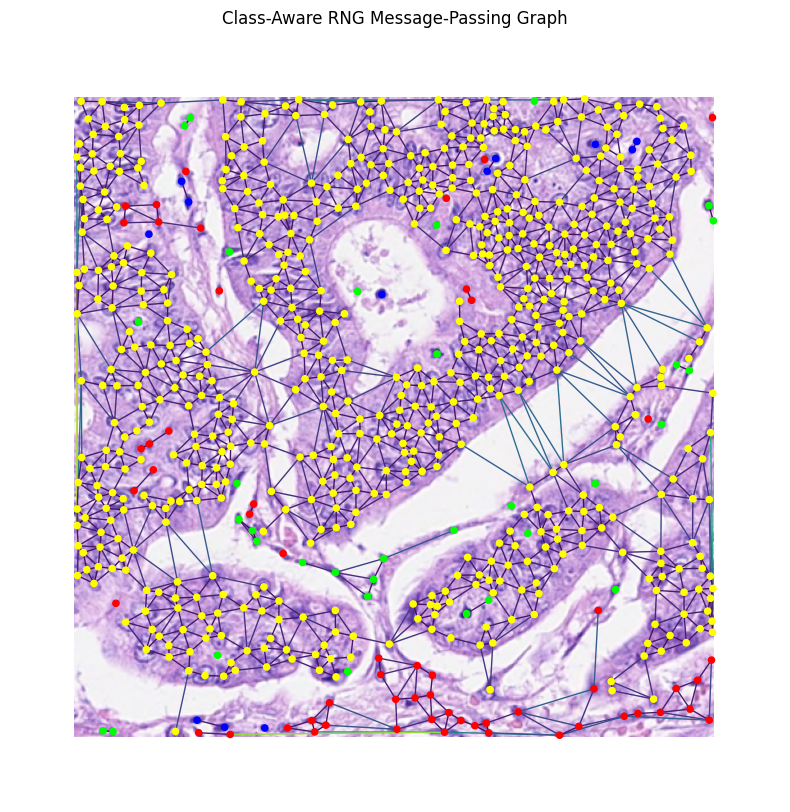

Class Vertex Counts: {'Miscellaneous': 33, 'Inflammatory': 12, 'Connective tissue': 640, 'Neoplastic epithelial': 57, 'Spindle-shaped': 0, 'Epithelial (Other)': 0}


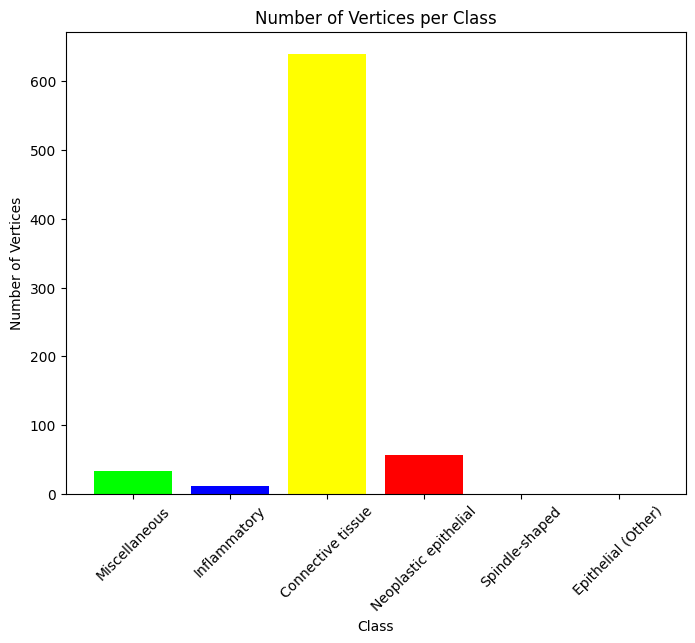

In [2]:
import os
import numpy as np
import matplotlib.colors as mcolors
import tensorflow as tf
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
from skimage.color import label2rgb
import networkx as nx
import scipy.io as sio
from scipy.spatial import Delaunay

# Define specific colors for each class
class_colors = {
    2: (0.0, 0.0, 1.0),   # Blue for Plasma
    1: (0.0, 1.0, 0.0),   # Green for Lymphocyte
    4: (1.0, 0.0, 0.0),   # Red for Epithelial
    3: (1.0, 1.0, 0.0),   # Yellow for Neutrophil
    5: (1.0, 0.0, 1.0),   # Magenta for Eosinophil
    6: (0.0, 1.0, 1.0)    # Cyan for Connective (other)
}

# Mapping class labels to their names
class_names = {
    1: 'Miscellaneous',
    2: 'Inflammatory',
    3: 'Connective tissue',
    4: 'Neoplastic epithelial',
    5: 'Spindle-shaped',
    6: 'Epithelial (Other)'
}

# Function to preprocess the image
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [500, 500])
    image = tf.cast(image, tf.float32) / 255.0
    return image

# Function to load and preprocess the label from the CoNSeP dataset
def load_lizard_label(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)

    inst_map = label['inst_map']
    inst_map_expanded = np.expand_dims(inst_map, axis=-1)
    inst_map_resized = tf.image.resize(tf.convert_to_tensor(inst_map_expanded, dtype=tf.float32), target_size, method='nearest').numpy()

    # CoNSeP-specific fields
    centroids = label['inst_centroid']
    scale_factor_x = target_size[1] / inst_map.shape[1]
    scale_factor_y = target_size[0] / inst_map.shape[0]
    centroids = centroids * [scale_factor_x, scale_factor_y]

    classes = label['inst_type'].flatten()
    has_bbox = 'bbox' in label
    bboxs = label['bbox'] if has_bbox else [None] * len(classes)

    features = []
    unique_values = np.unique(inst_map).tolist()[1:]

    for idx, value in enumerate(unique_values):
        feature = {
            'class': [int(classes[idx])],
            'bbox': bboxs[idx] if has_bbox else None,
            'centroid': centroids[idx]
        }
        features.append(feature)

    return inst_map_resized.squeeze(), features

# Build message passing graph based on Relative Neighborhood Graph (RNG)
def build_rng_message_passing_graph(features):
    G = nx.Graph()
    centroids = np.array([feature['centroid'] for feature in features])
    tri = Delaunay(centroids)

    for idx, feature in enumerate(features):
        class_label = feature['class'][0]
        color = class_colors.get(class_label, (1.0, 1.0, 1.0))
        G.add_node(idx, size=feature['bbox'], centroid=feature['centroid'], class_=class_label, color=color)

    for simplex in tri.simplices:
        for i in range(3):
            p1_idx = simplex[i]
            p2_idx = simplex[(i + 1) % 3]
            p1 = centroids[p1_idx]
            p2 = centroids[p2_idx]
            midpoint = (p1 + p2) / 2
            radius = np.linalg.norm(p1 - midpoint)

            is_relative_neighbor = True
            for j in range(3):
                if j != i and np.linalg.norm(midpoint - centroids[simplex[j]]) < radius:
                    is_relative_neighbor = False
                    break

            if is_relative_neighbor and features[p1_idx]['class'] == features[p2_idx]['class']:
                G.add_edge(p1_idx, p2_idx, weight=np.linalg.norm(p1 - p2))

    return G

# Count the vertices in different classes
def count_vertices_by_class(graph):
    class_counts = {class_name: 0 for class_name in class_names.values()}
    for node, data in graph.nodes(data=True):
        label = data['class_']
        if label in class_names:
            class_name = class_names[label]
            class_counts[class_name] += 1
        # Optionally else: print(f"Skipping node {node} with unknown class {label}")
    return class_counts

# Visualize the graph overlaid on the image and the segmentation
def visualize_class_aware_graph_with_legend(image, graph, inst_map, features, title='Class-Aware RNG Message-Passing Graph'):
    fig, ax = plt.subplots(figsize=(10, 10))
    image_np = image.numpy()
    ax.imshow(image_np)

    pos = {node: (data['centroid'][0], data['centroid'][1]) for node, data in graph.nodes(data=True)}
    node_colors = [data['color'] for _, data in graph.nodes(data=True)]
    nx.draw_networkx_nodes(graph, pos, node_size=20, node_color=node_colors, ax=ax)

    edge_weights = np.array([graph.edges[edge]['weight'] for edge in graph.edges()])
    edge_colors = edge_weights
    edge_alphas = edge_weights / max(edge_weights)
    nx.draw_networkx_edges(graph, pos, ax=ax, edge_color=edge_colors, style='solid', alpha=1, width=1)

   # legend_labels = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=class_colors[i], markersize=10) for i in class_colors]
    #ax.legend(legend_labels, [class_names[i] for i in class_colors], loc='upper right')

    plt.title(title)
    plt.axis('off')
    plt.show()

# Visualize class counts
def visualize_class_counts(class_counts):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.bar(classes, counts, color=[class_colors[i+1] for i in range(len(class_counts))])
    ax.set_title("Number of Vertices per Class")
    ax.set_ylabel("Number of Vertices")
    ax.set_xlabel("Class")
    plt.xticks(rotation=45)
    plt.show()

# Example usage
image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_14.png'
label_path = '/kaggle/input/output2/mat/test_14.mat'

# Preprocess the image
image = preprocess_image(image_path)

# Load the label, instance map, and features
inst_map_resized, features = load_lizard_label(label_path)

# Build the message-passing graph based on RNG
graph = build_rng_message_passing_graph(features)

# Visualize the RNG-based message-passing graph on top of the image
visualize_class_aware_graph_with_legend(image, graph, inst_map_resized, features)

# Count and display the vertices in different classes
class_counts = count_vertices_by_class(graph)
print("Class Vertex Counts:", class_counts)

# Visualize the class counts as a bar plot
visualize_class_counts(class_counts)


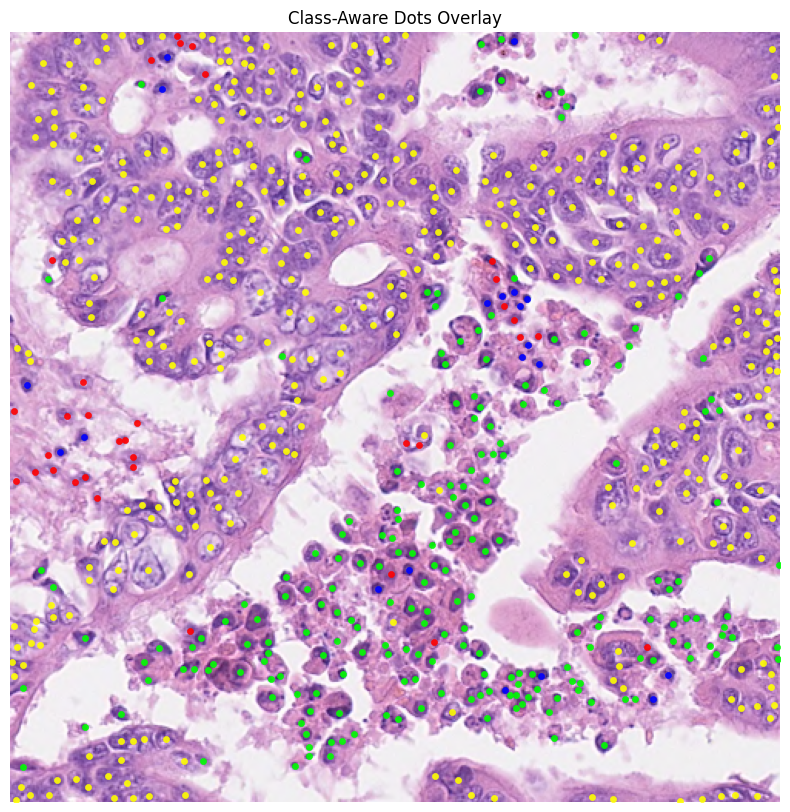

In [3]:
import os
import numpy as np
import tensorflow as tf
import scipy.io as sio
import matplotlib.pyplot as plt

# Class color and name mapping (CoNSeP style)
class_colors = {
    1: (0.0, 1.0, 0.0),   # Green for Miscellaneous
    2: (0.0, 0.0, 1.0),   # Blue for Inflammatory
    5: (1.0, 0.0, 1.0),   # Magenta for Connective tissue
    4: (1.0, 0.0, 0.0),   # Red for Neoplastic epithelial
    3: (1.0, 1.0, 0.0),   # Yellow for Spindle-shaped
    6: (0.0, 1.0, 1.0)    # Cyan for Epithelial (Other)
}
class_names = {
    1: 'Miscellaneous',
    2: 'Inflammatory',
    3: 'Connective tissue',
    4: 'Neoplastic epithelial',
    5: 'Spindle-shaped',
    6: 'Epithelial (Other)'
}

def preprocess_image(image_path, target_size=(500, 500)):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, target_size)
    image = tf.cast(image, tf.float32) / 255.0
    return image.numpy()

def load_label_centroids_classes(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)
    inst_map = label['inst_map']
    centroids = label['inst_centroid']
    classes = label['inst_type'].flatten()
    # Adjust centroids if image resized
    scale_x = target_size[1] / inst_map.shape[1]
    scale_y = target_size[0] / inst_map.shape[0]
    centroids = centroids * [scale_x, scale_y]
    return centroids, classes

def plot_class_aware_dots(image_path, label_path, target_size=(500, 500)):
    image = preprocess_image(image_path, target_size)
    centroids, classes = load_label_centroids_classes(label_path, target_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    
    # Plot each class in a different color
    for class_id, color in class_colors.items():
        inds = np.where(classes == class_id)[0]
        if len(inds) > 0:
           plt.scatter(centroids[inds, 0], centroids[inds, 1], 
                        c=[color], s=20, label=class_names[class_id], alpha=0.9, linewidths=0.4)
    
   # plt.legend(loc='upper right')
    plt.title('Class-Aware Dots Overlay')
    plt.axis('off')
    plt.show()

# Example usage
image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_11.png'
label_path = '/kaggle/input/output2/mat/test_11.mat'
plot_class_aware_dots(image_path, label_path)
########## hover net ############

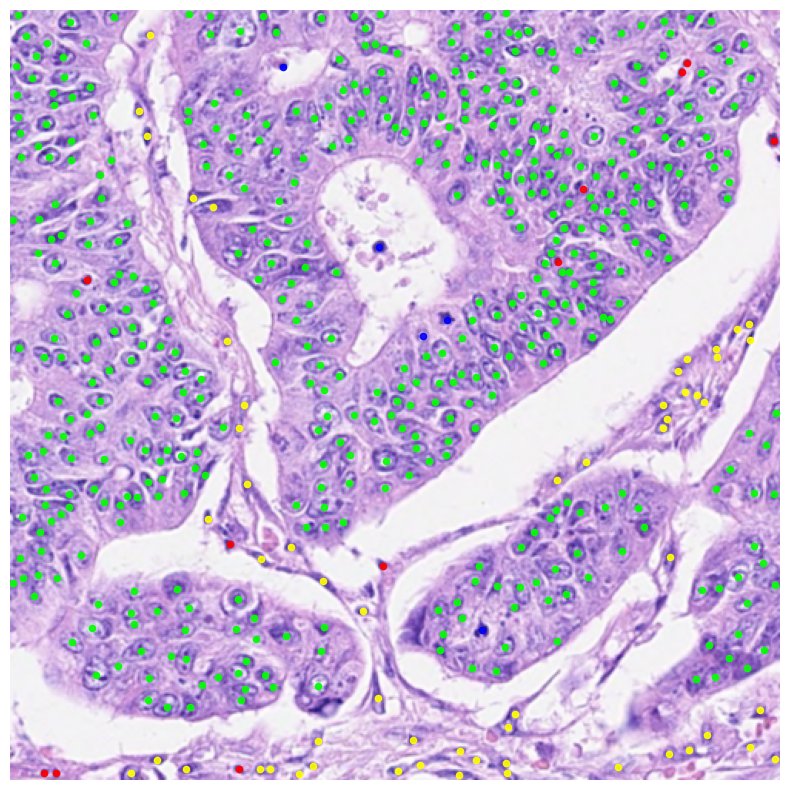

In [8]:
import os
import numpy as np
import tensorflow as tf
import scipy.io as sio
import matplotlib.pyplot as plt

# Class color and name mapping (CoNSeP style)
class_colors = {
    1: (0.0, 0.0, 1.0),   # Blue for Plasma
    4: (0.0, 1.0, 0.0),   # Green for Lymphocyte
    2: (1.0, 0.0, 0.0),   # Red for Epithelial
    5: (1.0, 1.0, 0.0),   # Yellow for Neutrophil
    3: (1.0, 0.0, 1.0),   # Magenta for Eosinophil
    6: (0.0, 1.0, 1.0)    # Cyan for Connective (other)
}

# Mapping class labels to their names
class_names = {
    1: 'Miscellaneous',
    2: 'Inflammatory',
    3: 'Connective tissue',
    4: 'Neoplastic epithelial',
    5: 'Spindle-shaped',
    6: 'Epithelial (Other)'
}

def preprocess_image(image_path, target_size=(500, 500)):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, target_size)
    image = tf.cast(image, tf.float32) / 255.0
    return image.numpy()

def load_label_centroids_classes(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)
    inst_map = label['inst_map']
    centroids = label['inst_centroid']
    classes = label['inst_type'].flatten()
    # Adjust centroids if image resized
    scale_x = target_size[1] / inst_map.shape[1]
    scale_y = target_size[0] / inst_map.shape[0]
    centroids = centroids * [scale_x, scale_y]
    return centroids, classes

def plot_class_aware_dots(image_path, label_path, target_size=(500, 500)):
    image = preprocess_image(image_path, target_size)
    centroids, classes = load_label_centroids_classes(label_path, target_size)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    
    # Plot each class in a different color
    for class_id, color in class_colors.items():
        inds = np.where(classes == class_id)[0]
        if len(inds) > 0:
            plt.scatter(centroids[inds, 0], centroids[inds, 1], 
                       c=[color], s=20, label=class_names[class_id], alpha=0.9)
    
   # plt.legend(loc='upper right')
  #  plt.title('Class-Aware Dots Overlay')
    plt.axis('off')
    plt.show()

# Example usage
image_path = '/kaggle/input/consept/CoNSeP/Test/Images/test_14.png'
label_path = '/kaggle/input/gtruth/Labels/test_14.mat'
plot_class_aware_dots(image_path, label_path)
########## Original ############

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Dense, Dropout, LayerNormalization
from spektral.layers import GCNConv, GlobalAvgPool
import networkx as nx
import scipy.io as sio
from scipy.spatial import Delaunay

# Define specific colors for each class
class_colors = {
    4: (1.0, 0.0, 0.0),   # Red for Epithelial
    2: (0.0, 1.0, 0.0),   # Green for Lymphocyte
    3: (0.0, 0.0, 1.0),   # Blue for Plasma
    1: (1.0, 1.0, 0.0),   # Yellow for Neutrophil
    5: (1.0, 0.0, 1.0),   # Magenta for Eosinophil
    6: (0.0, 1.0, 1.0)    # Cyan for Connective
}

def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [500, 500])
    image = tf.cast(image, tf.float32)
    image = image / 255.0
    return image

def load_lizard_label(label_path, target_size=(500, 500)):
    label = sio.loadmat(label_path)
    inst_map = label['inst_map']
    inst_map_expanded = np.expand_dims(inst_map, axis=-1)
    inst_map_resized = tf.image.resize(tf.convert_to_tensor(inst_map_expanded, dtype=tf.float32), target_size, method='nearest').numpy()
    nuclei_id = np.squeeze(label['id']).tolist()
    classes = label['class']
    bboxs = label['bbox']
    centroids = label['centroid']
    features = []
    unique_values = np.unique(inst_map).tolist()[1:]
    for value in unique_values:
        idx = nuclei_id.index(value)
        feature = {'class': classes[idx], 'bbox': bboxs[idx], 'centroid': centroids[idx]}
        features.append(feature)
    return inst_map_resized.squeeze(), features

def build_rng_message_passing_graph(features):
    G = nx.Graph()
    centroids = np.array([f['centroid'] for f in features])
    tri = Delaunay(centroids)
    for idx, feature in enumerate(features):
        G.add_node(idx, size=feature['bbox'], centroid=feature['centroid'], class_=feature['class'][0], color=class_colors.get(feature['class'][0], (1.0, 1.0, 1.0)))
    for simplex in tri.simplices:
        for i in range(3):
            p1_idx, p2_idx = simplex[i], simplex[(i + 1) % 3]
            if all(np.linalg.norm((centroids[p1_idx] + centroids[p2_idx]) / 2 - centroids[simplex[j]]) >= np.linalg.norm(centroids[p1_idx] - centroids[p2_idx]) / 2 for j in range(3)):
                G.add_edge(p1_idx, p2_idx, weight=np.linalg.norm(centroids[p1_idx] - centroids[p2_idx]))
    return G

# Model definition
class AdaptiveGNNTransformer(Model):
    def __init__(self, num_features, num_classes, dropout_rate=0.1, ff_dim=256):
        super(AdaptiveGNNTransformer, self).__init__()
        self.graph_conv = GCNConv(128, activation='relu')  # Graph Convolution Layer
        self.layer_norm1 = LayerNormalization(epsilon=1e-6)
        self.dropout = Dropout(dropout_rate)
        self.ffn = tf.keras.Sequential([
            Dense(ff_dim, activation='relu'),
            Dropout(dropout_rate),
            Dense(128, activation='relu')
        ])
        self.global_pool = GlobalAvgPool()
        self.classifier = Dense(num_classes, activation='softmax')

    def call(self, inputs, training=False):
        x, a = inputs  # Node features and adjacency matrix
        x1 = self.graph_conv([x, a])  # Remove mask argument
        x1 = self.layer_norm1(x1 + x)  # Residual connection
        x2 = self.ffn(x1)
        x2 = self.dropout(x2, training=training)
        graph_features = self.global_pool(x2)
        return self.classifier(graph_features)

    
# Main execution
image_path = '/kaggle/input/lizard-dataset/lizard_images1/Lizard_Images1/consep_1.png'
label_path = '/kaggle/input/lizard-dataset/lizard_labels/Lizard_Labels/Labels/consep_1.mat'
image = preprocess_image(image_path)
inst_map_resized, features = load_lizard_label(label_path)
graph = build_rng_message_passing_graph(features)

features_array = np.expand_dims(np.array([f['centroid'] for f in features]), axis=0).astype(np.float32)
adjacency_matrix = np.expand_dims(nx.to_numpy_array(graph), axis=0).astype(np.float32)
labels = np.array([f['class'][0] for f in features])
labels = np.expand_dims(labels, axis=0)  # Add batch dimension
num_features = features_array.shape[2]
num_classes = len(np.unique(labels))

# Initialize the model
model = AdaptiveGNNTransformer(num_features, num_classes)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Test the model with dummy data
try:
    dummy_features = np.random.rand(1, 528, 2).astype(np.float32)
    dummy_adjacency = np.random.rand(1, 528, 528).astype(np.float32)
    output = model([dummy_features, dummy_adjacency], training=False)
    print("Model test output shape:", output.shape)
except Exception as e:
    print("Error during model test call:", e)

# Train the model
model.fit([features_array, adjacency_matrix], labels, epochs=10, batch_size=1)


In [ ]:
import spektral
print(dir(spektral.layers))

In [ ]:
!pip install torch
!pip install torch-scatter torch-sparse torch-spline-conv torch-geometric

In [ ]:
!pip install torch-geometric


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data, DataLoader
import networkx as nx
import scipy.io as sio
from scipy.spatial import Delaunay
import cv2
import pickle
from torch.nn import TransformerEncoder, TransformerEncoderLayer
from sklearn.metrics import f1_score, accuracy_score

# Define specific colors for each class (1 to 6)
class_colors = {
    1: (1.0, 0.0, 0.0),   # Red for Epithelial
    2: (0.0, 1.0, 0.0),   # Green for Lymphocyte
    3: (0.0, 0.0, 1.0),   # Blue for Plasma
    4: (1.0, 1.0, 0.0),   # Yellow for Neutrophil
    5: (1.0, 0.0, 1.0),   # Magenta for Eosinophil
    6: (0.0, 1.0, 1.0)    # Cyan for Connective
}

def load_lizard_label(label_path):
    label = sio.loadmat(label_path)
    inst_map = label['inst_map']
    nuclei_id = np.squeeze(label['id']).tolist()
    classes = label['class'].flatten()
    bboxs = label['bbox']
    centroids = label['centroid']
    
    features = []
    for value in np.unique(inst_map)[1:]:
        if value in nuclei_id:
            idx = nuclei_id.index(value)
            features.append({
                'id': value, 
                'class': classes[idx], 
                'bbox': bboxs[idx], 
                'centroid': centroids[idx]
            })
    return features, inst_map

def build_rng_message_passing_graph(features):
    G = nx.Graph()
    centroids = np.array([f['centroid'] for f in features])
    tri = Delaunay(centroids)
    
    for idx, feature in enumerate(features):
        G.add_node(idx, **feature)
    for simplex in tri.simplices:
        for i in range(3):
            G.add_edge(simplex[i], simplex[(i + 1) % 3])
    return G

def extract_visual_features_from_segment(image, instance_map, nucleus_id, device):
    image_tensor = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1).to(device)
    instance_map_tensor = torch.tensor(instance_map, dtype=torch.float32).to(device)
    mask_tensor = (instance_map_tensor == nucleus_id).float()
    masked_image_tensor = image_tensor * mask_tensor.unsqueeze(0)
    non_zero_pixels = masked_image_tensor[:, mask_tensor > 0]
    
    if non_zero_pixels.numel() > 0:
        mean_intensity = torch.mean(non_zero_pixels, dim=1).cpu().numpy()
        area = mask_tensor.sum().item()
    else:
        mean_intensity, area = np.array([0, 0, 0]), 0
    return np.concatenate([mean_intensity, [area]])

def preprocess_and_save_data(image_paths, label_paths, save_dir, device):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    
    for image_path, label_path in zip(image_paths, label_paths):
        data = load_and_preprocess_data(image_path, label_path, device)
        save_path = os.path.join(save_dir, os.path.basename(image_path) + '.pt')  # Using .pt for PyTorch
        torch.save(data, save_path)  # Using torch.save for better integration

def load_and_preprocess_data(image_path, label_path, device):
    features, inst_map = load_lizard_label(label_path)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    graph = build_rng_message_passing_graph(features)

    node_features = [
        np.concatenate([feature['centroid'], feature['bbox'],
                        extract_visual_features_from_segment(image, inst_map, feature['id'], device)])
        for feature in features
    ]
    labels = np.array([f['class'] for f in features])
    _, labels_mapped = np.unique(labels, return_inverse=True)
    
    data = Data(x=torch.tensor(node_features, dtype=torch.float).to(device),
                edge_index=torch.tensor(np.array(graph.edges).T, dtype=torch.long).to(device),
                y=torch.tensor(labels_mapped, dtype=torch.long).to(device))
    return data

class PreprocessedDataset(torch.utils.data.Dataset):
    def __init__(self, preprocessed_paths):
        self.preprocessed_paths = preprocessed_paths

    def __len__(self):
        return len(self.preprocessed_paths)

    def __getitem__(self, idx):
        return torch.load(self.preprocessed_paths[idx])

class AdaptiveGNNTransformer(torch.nn.Module):
    def __init__(self, num_features, num_classes, hidden_dim=64, nhead=2, num_encoder_layers=2, dropout_rate=0.4, ff_dim=128):
        super().__init__()
        self.gcn_conv1 = GCNConv(num_features, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.gcn_conv2 = GCNConv(hidden_dim, hidden_dim)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.gcn_conv3 = GCNConv(hidden_dim, hidden_dim // 2)
        self.bn3 = nn.BatchNorm1d(hidden_dim // 2)
        
        encoder_layers = TransformerEncoderLayer(hidden_dim // 2, nhead, ff_dim, dropout_rate, batch_first=True)
        self.transformer_encoder = TransformerEncoder(encoder_layers, num_encoder_layers)
        
        self.fc1 = nn.Linear(hidden_dim // 2, ff_dim)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(ff_dim, 64)
        self.classifier = nn.Linear(64, num_classes)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.bn1(self.gcn_conv1(x, edge_index)))
        x = F.relu(self.bn2(self.gcn_conv2(x, edge_index)))
        x = F.relu(self.bn3(self.gcn_conv3(x, edge_index)))
        x = self.transformer_encoder(x.unsqueeze(0)).squeeze(0)
        x = F.relu(self.fc1(x))
        x = self.dropout(F.relu(self.fc2(x)))
        return self.classifier(x)  # Output logits directly

def main():
    image_dirs = ['/kaggle/input/lizard-dataset/lizard_images1/Lizard_Images1', '/kaggle/input/lizard-dataset/lizard_images2/Lizard_Images2']
    label_dir = '/kaggle/input/lizard-dataset/lizard_labels/Lizard_Labels/Labels'
    image_paths = [os.path.join(dir, file) for dir in image_dirs for file in os.listdir(dir) if file.endswith('.png')]
    label_paths = [os.path.join(label_dir, os.path.basename(path).replace('.png', '.mat')) for path in image_paths]
    preprocess_dir = '/kaggle/working/preprocessed_data'
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Ensure the preprocess directory exists before listing or writing
    if not os.path.exists(preprocess_dir):
        os.makedirs(preprocess_dir)

    # Only preprocess and save data if the directory is empty
    if not os.listdir(preprocess_dir):
        preprocess_and_save_data(image_paths, label_paths, preprocess_dir, device)

    preprocessed_paths = [os.path.join(preprocess_dir, f) for f in os.listdir(preprocess_dir) if f.endswith('.pt')]
    dataset = PreprocessedDataset(preprocessed_paths)
    dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
    model = AdaptiveGNNTransformer(num_features=dataset[0].x.shape[1], num_classes=6).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    # Training loop
    model.train()
    for epoch in range(30):
        total_loss = 0
        total_correct = 0
        total_samples = 0
        all_targets = []
        all_predictions = []

        for data in dataloader:
            data = data.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = F.nll_loss(outputs, data.y)
            loss.backward()
            optimizer.step()

            total_loss += loss.item() * data.num_nodes
            total_correct += calculate_accuracy(outputs, data.y) * data.num_nodes
            total_samples += data.num_nodes

            all_predictions.extend(outputs.max(1)[1].detach().cpu().numpy())
            all_targets.extend(data.y.cpu().numpy())

        scheduler.step()

        epoch_accuracy = total_correct / total_samples
        epoch_f1 = calculate_f1(torch.tensor(all_predictions), torch.tensor(all_targets))
        epoch_loss = total_loss / total_samples

        print(f"Epoch {epoch+1}: Loss {epoch_loss:.4f}, Accuracy {epoch_accuracy:.4f}, F1 Score {epoch_f1:.4f}")

if __name__ == '__main__':
    main()


In [ ]:
!pip install torch-geometric

In [ ]:
pip install h5py


In [ ]:
!pip install ipywidgets


In [ ]:
import os
import numpy as np
import torch
import cv2
import scipy.io as sio
import h5py
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from scipy.spatial import Delaunay

def load_lizard_label(label_path):
    """Load labels and features from a MATLAB file."""
    label = sio.loadmat(label_path)
    inst_map = label['inst_map']
    nuclei_id = np.squeeze(label['id']).tolist()
    classes = np.squeeze(label['class'])
    bboxs = label['bbox']
    centroids = label['centroid']

    features = []
    for value in np.unique(inst_map)[1:]:  # Exclude background labeled as '0'
        if value in nuclei_id:
            idx = nuclei_id.index(value)
            features.append({
                'id': value,
                'class': classes[idx],
                'bbox': bboxs[idx],
                'centroid': centroids[idx]
            })
    return features, inst_map

def compute_edge_index(centroids):
    """Compute edge indices using Delaunay triangulation based on centroids."""
    tri = Delaunay(centroids)
    edges = []
    for simplex in tri.simplices:
        for i in range(len(simplex)):
            for j in range(i + 1, len(simplex)):
                edges.append([simplex[i], simplex[j]])
    return torch.tensor(edges, dtype=torch.long).t().contiguous()

def extract_visual_features_from_segment(image, instance_map, nucleus_id, device):
    """Extract visual features from a segmented nucleus."""
    image_tensor = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1).to(device)
    instance_map_tensor = torch.tensor(instance_map, dtype=torch.float32).to(device)
    mask_tensor = (instance_map_tensor == nucleus_id).float()
    masked_image_tensor = image_tensor * mask_tensor.unsqueeze(0)
    non_zero_pixels = masked_image_tensor[:, mask_tensor > 0]

    mean_intensity = torch.mean(non_zero_pixels, dim=1).cpu().numpy() if non_zero_pixels.numel() > 0 else np.array([0, 0, 0])
    area = mask_tensor.sum().item()
    return np.concatenate([mean_intensity, [area]])

def preprocess_and_save_data_hdf5(image_paths, label_paths, save_dir, device, sample_rate=0.7):
    """Preprocess images and labels and save them in HDF5 format."""
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    with h5py.File(os.path.join(save_dir, 'data.h5'), 'w') as h5f:
        for image_path, label_path in zip(image_paths, label_paths):
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            features, inst_map = load_lizard_label(label_path)

            centroids = np.array([feature['centroid'] for feature in features])
            edge_index = compute_edge_index(centroids).numpy()

            num_samples = int(len(features) * sample_rate)
            sampled_features = np.random.choice(features, num_samples, replace=False)

            node_features = np.array([
                np.concatenate([feature['centroid'], feature['bbox'],
                                extract_visual_features_from_segment(image, inst_map, feature['id'], device)])
                for feature in sampled_features
            ])

            labels = np.array([feature['class'] for feature in sampled_features])
            _, labels_mapped = np.unique(labels, return_inverse=True)

            grp = h5f.create_group(os.path.basename(image_path))
            grp.create_dataset('features', data=node_features)
            grp.create_dataset('edge_index', data=edge_index)
            grp.create_dataset('labels', data=labels_mapped)

            print(f"Processed and saved data for {image_path}")
        print("All images processed and data saved.")

def main():
    image_dirs = ['/kaggle/input/lizard-dataset/lizard_images1/Lizard_Images1', '/kaggle/input/lizard-dataset/lizard_images2/Lizard_Images2']
    label_dir = '/kaggle/input/lizard-dataset/lizard_labels/Lizard_Labels/Labels'
    image_paths = [os.path.join(dir, file) for dir in image_dirs for file in os.listdir(dir) if file.endswith('.png')]
    label_paths = [os.path.join(label_dir, os.path.basename(path).replace('.png', '.mat')) for path in image_paths]
    preprocess_dir = '/kaggle/working/image_features'
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    preprocess_and_save_data_hdf5(image_paths, label_paths, preprocess_dir, device, sample_rate=0.7)

if __name__ == '__main__':
    main()

In [ ]:
import os
import torch
import torch.nn.functional as F
from torch_geometric.data import DataLoader, Data  # Import Data
from torch_geometric.nn import GCNConv, BatchNorm
from torch.nn import TransformerEncoder, TransformerEncoderLayer
from sklearn.metrics import f1_score
import h5py

class PreprocessedHDF5Dataset(torch.utils.data.Dataset):
    def __init__(self, file_path):
        self.h5_file = h5py.File(file_path, 'r')
        self.keys = list(self.h5_file.keys())
        print(f"Found {len(self.keys)} entries in the HDF5 file.")

    def __len__(self):
        return len(self.keys)

    def __getitem__(self, idx):
        group = self.h5_file[self.keys[idx]]
        x = torch.tensor(group['features'][:], dtype=torch.float32)
        edge_index = torch.tensor(group['edge_index'][:], dtype=torch.long)
        y = torch.tensor(group['labels'][:], dtype=torch.long)

        # Ensure num_nodes is correctly calculated to cover all edge indices
        num_nodes = x.size(0)

        # Silently filter out invalid edge indices without printing
        if edge_index.max().item() >= num_nodes:
            mask = edge_index < num_nodes
            edge_index = edge_index[:, mask.all(dim=0)]  # Keep only valid edges

        return Data(x=x, edge_index=edge_index, y=y, num_nodes=num_nodes)

    def close(self):
        self.h5_file.close()

class AdaptiveGNNTransformer(torch.nn.Module):
    def __init__(self, num_features, num_classes, hidden_dim=128, nhead=8, num_encoder_layers=2, dropout_rate=0.5, ff_dim=128):
        super().__init__()
        self.gcn_conv1 = GCNConv(num_features, hidden_dim)
        self.bn1 = BatchNorm(hidden_dim)
        self.gcn_conv2 = GCNConv(hidden_dim, hidden_dim)
        self.bn2 = BatchNorm(hidden_dim)
        self.gcn_conv3 = GCNConv(hidden_dim, hidden_dim // 2)
        self.bn3 = BatchNorm(hidden_dim // 2)
        encoder_layer = TransformerEncoderLayer(d_model=hidden_dim // 2, nhead=nhead, dim_feedforward=ff_dim, dropout=dropout_rate)
        self.transformer_encoder = TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)
        self.fc1 = torch.nn.Linear(hidden_dim // 2, ff_dim)
        self.dropout = torch.nn.Dropout(dropout_rate)
        self.classifier = torch.nn.Linear(ff_dim, num_classes)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.bn1(self.gcn_conv1(x, edge_index)))
        x = F.relu(self.bn2(self.gcn_conv2(x, edge_index)))
        x = F.relu(self.bn3(self.gcn_conv3(x, edge_index)))
        x = self.transformer_encoder(x.unsqueeze(0)).squeeze(0)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.classifier(x)
        return F.log_softmax(x, dim=1)

def train_model():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    hdf5_file_path = '/kaggle/input/featuresh5/data (2).h5'
    dataset = PreprocessedHDF5Dataset(hdf5_file_path)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=4, pin_memory=True)

    model = AdaptiveGNNTransformer(num_features=10, num_classes=6).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0015, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    print("Starting training process...")
    model.train()
    try:
        for epoch in range(100):
            total_loss = 0
            all_preds = []
            all_labels = []

            for data in dataloader:
                data = data.to(device)
                optimizer.zero_grad()
                outputs = model(data)
                loss = F.nll_loss(outputs, data.y)
                loss.backward()
                optimizer.step()

                total_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(data.y.cpu().numpy())

            scheduler.step()
            f1 = f1_score(all_labels, all_preds, average='macro')
            print(f"Epoch {epoch+1}: Loss {total_loss:.4f}, F1 Score: {f1:.4f}")
    finally:
        dataset.close()  # Ensure resources are freed properly

if __name__ == '__main__':
    train_model()


In [ ]:
import os
import torch
import h5py
import matplotlib.pyplot as plt
import networkx as nx
from torch_geometric.utils import to_networkx
from torch_geometric.data import Data
from torch_geometric.data import DataLoader
from torch_geometric.nn import GCNConv
from sklearn.decomposition import PCA

# Preprocessed HDF5 Dataset
class PreprocessedHDF5Dataset(torch.utils.data.Dataset):
    def __init__(self, file_path):
        self.h5_file = h5py.File(file_path, 'r')
        self.keys = list(self.h5_file.keys())
        print(f"Found {len(self.keys)} entries in the HDF5 file.")

    def __len__(self):
        return len(self.keys)

    def __getitem__(self, idx):
        group = self.h5_file[self.keys[idx]]
        x = torch.tensor(group['features'][:], dtype=torch.float32)
        edge_index = torch.tensor(group['edge_index'][:], dtype=torch.long)
        y = torch.tensor(group['labels'][:], dtype=torch.long)

        # Ensure num_nodes is correctly calculated to cover all edge indices
        num_nodes = x.size(0)
        print(f"Index {idx}: num_nodes calculated as {num_nodes}")

        # Verify that all edges are within the valid range
        if edge_index.max().item() >= num_nodes:
            print(f"Warning: edge_index contains out-of-bound values at index {idx}.")
            mask = edge_index < num_nodes
            edge_index = edge_index[:, mask.all(dim=0)]  # Keep only valid edges
            print(f"Filtered edge_index size: {edge_index.size()}")

        return Data(x=x, edge_index=edge_index, y=y, num_nodes=num_nodes)

    def close(self):
        self.h5_file.close()
        print("HDF5 file closed.")

# Visualizing a Graph from the Dataset
def visualize_graph(data):
    # Convert PyTorch Geometric data to NetworkX graph
    G = to_networkx(data, to_undirected=True, node_attrs=['x'])

    # Reduce the dimensionality of the node features to 2D using PCA (for color visualization)
    pca = PCA(n_components=2)
    node_features_2d = pca.fit_transform(data.x.cpu().numpy())

    # Plotting the graph with node features
    plt.figure(figsize=(8, 8))
    nx.draw_networkx_nodes(G, pos=node_features_2d, node_size=30, cmap='coolwarm',
                           node_color=data.y.cpu().numpy())
    nx.draw_networkx_edges(G, pos=node_features_2d, alpha=0.5)
    plt.title("Graph Visualization")
    plt.show()

def load_single_image_graph(hdf5_file_path, index):
    dataset = PreprocessedHDF5Dataset(hdf5_file_path)
    
    # Load a single image graph at the provided index
    data = dataset[index]
    
    # Visualize the graph
    visualize_graph(data)

    # Close the dataset
    dataset.close()

# Example usage
hdf5_file_path = '/kaggle/input/featuresh5/data (2).h5'
image_index = 35  # Change to the index of the image graph you want to visualize
load_single_image_graph(hdf5_file_path, image_index)


In [ ]:
import os
import torch
import h5py
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.decomposition import PCA
from torch_geometric.utils import to_networkx
from torch_geometric.data import Data

# Preprocessed HDF5 Dataset
class PreprocessedHDF5Dataset(torch.utils.data.Dataset):
    def __init__(self, file_path):
        self.h5_file = h5py.File(file_path, 'r')
        self.keys = list(self.h5_file.keys())
        print(f"Found {len(self.keys)} entries in the HDF5 file.")

    def __len__(self):
        return len(self.keys)

    def __getitem__(self, idx):
        group = self.h5_file[self.keys[idx]]
        x = torch.tensor(group['features'][:], dtype=torch.float32)
        edge_index = torch.tensor(group['edge_index'][:], dtype=torch.long)
        y = torch.tensor(group['labels'][:], dtype=torch.long)

        # Ensure num_nodes is correctly calculated to cover all edge indices
        num_nodes = x.size(0)
        print(f"Index {idx}: num_nodes calculated as {num_nodes}")

        # Verify that all edges are within the valid range
        if edge_index.max().item() >= num_nodes:
            print(f"Warning: edge_index contains out-of-bound values at index {idx}.")
            mask = edge_index < num_nodes
            edge_index = edge_index[:, mask.all(dim=0)]  # Filter invalid edges
            print(f"Filtered edge_index size: {edge_index.size()}")

        # Retrieve spatial coordinates (if available) or use PCA
        if 'coordinates' in group:
            pos = torch.tensor(group['coordinates'][:], dtype=torch.float32)
        else:
            pos = None

        return Data(x=x, edge_index=edge_index, y=y, num_nodes=num_nodes, pos=pos)

    def close(self):
        self.h5_file.close()
        print("HDF5 file closed.")

# Visualization of Segmented Features
def visualize_segmented_features(data):
    # Convert the PyTorch Geometric Data object into a NetworkX graph
    G = to_networkx(data, to_undirected=True, node_attrs=['x'])

    # If spatial coordinates are available, use them for plotting
    if data.pos is not None:
        pos = data.pos.cpu().numpy()
    else:
        # If no spatial coordinates, reduce feature dimensions using PCA
        pca = PCA(n_components=2)
        pos = pca.fit_transform(data.x.cpu().numpy())

    # Create a color map based on node labels (segments)
    node_color = data.y.cpu().numpy()

    # Plotting the segmented features graph
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(G, pos=pos, node_size=50, cmap='coolwarm', node_color=node_color)
    nx.draw_networkx_edges(G, pos=pos, alpha=0.5)
    plt.title("Segmented Features Visualization")
    plt.axis('off')
    plt.show()

# Function to load and visualize segmented features for a specific index
def load_and_visualize_segmented_image(hdf5_file_path, index):
    dataset = PreprocessedHDF5Dataset(hdf5_file_path)
    data = dataset[index]  # Load the graph for the specified image index
    visualize_segmented_features(data)  # Visualize the segmented graph
    dataset.close()

# Example usage
hdf5_file_path = '/kaggle/input/featuresh5/data (2).h5'
image_index = 6  # Specify the image index you want to visualize
load_and_visualize_segmented_image(hdf5_file_path, image_index)


In [ ]:
!rm -rf hover_net
!git clone https://github.com/vqdang/hover_net.git

In [ ]:
!pip install pycocotools tqdm


In [ ]:
import json

type_info = {
    "0" : ["nolabe", [0  ,   0,   0]], 
    "1" : ["neopla", [255,   0,   0]], 
    "2" : ["inflam", [0  , 255,   0]], 
    "3" : ["connec", [0  ,   0, 255]], 
    "4" : ["necros", [255, 255,   0]], 
    "5" : ["no-neo", [255, 165,   0]] 
}

with open("hover_net/type_info_consep.json", "w") as f:
    json.dump(type_info, f)

In [ ]:
import os

model_dir = "/kaggle/input/concep-chkp/concep_chkpoint"
print(os.listdir(model_dir))

In [ ]:
!pip install scikit-image matplotlib opencv-python openslide-python


In [ ]:
!python hover_net/run_infer.py \
  --nr_types=5 \
  --type_info_path hover_net/type_info_consep.json \
  --model_mode original \
  --model_path '/kaggle/input/concep-chkp/concep_chkpoint/hovernet_original_consep_type_tf2pytorch (1).tar' \
  tile \
  --input_dir /kaggle/input/consept/CoNSeP/Test/Images \
  --output_dir /kaggle/working/hover_output

In [ ]:
!python hover_net/run_infer.py \
  --nr_types=6 \
  --type_info_path hover_net/type_info_consep.json \
  --model_mode original \
  --model_path /kaggle/input/hoverbesttt/hovernet_original_consep_type_tf2pytorch \
  --input_dir /kaggle/input/consept/CoNSeP/Test/Images \
  --output_dir /kaggle/working/hover_output \
  tile

In [ ]:
import shutil

shutil.make_archive('hover_output2', 'zip', 'hover_output')

In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
from hovernet.models.hovernet_consep import HoVerNet
from skimage.io import imsave

# === CONFIGURATION ===
checkpoint_path = '/kaggle/input/hoverbesttt/hovernet_original_consep_type_tf2pytorch'
image_dir = '/kaggle/input/consept/CoNSeP/Test'
output_dir = '/kaggle/working/'
os.makedirs(output_dir, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# === PREPROCESSING FUNCTION ===
def preprocess_image(img_path):
    img = Image.open(img_path).convert('RGB')
    img = img.resize((1000, 1000))  # HoverNet expects 1000x1000
    tfms = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)
    ])
    return tfms(img).unsqueeze(0)  # Add batch dimension

# === LOAD MODEL ===
print("Loading model...")
model = HoVerNet(num_types=7)  # 6 cell types + background
model.load_state_dict(torch.load(checkpoint_path, map_location=device)['desc'])
model.to(device)
model.eval()

# === INFERENCE LOOP ===
print("Running inference...")
for img_name in os.listdir(image_dir):
    if not img_name.lower().endswith(('.png', '.jpg', '.tif')):
        continue

    img_path = os.path.join(image_dir, img_name)
    input_tensor = preprocess_image(img_path).to(device)

    with torch.no_grad():
        pred_dict = model(input_tensor)

    # Get instance map (channel 0), type map (channel 2)
    inst_map = pred_dict['np'][0].cpu().numpy().astype(np.uint16)
    type_map = pred_dict['tp'][0].cpu().numpy().astype(np.uint8)

    # Save predictions
    base_name = os.path.splitext(img_name)[0]
    imsave(os.path.join(output_dir, f'{base_name}_inst.png'), inst_map)
    imsave(os.path.join(output_dir, f'{base_name}_type.png'), type_map)

    print(f"Inference done: {img_name}")

print("All done. Results saved in:", output_dir)


In [ ]:
import shutil

shutil.make_archive('hover_output', 'tar', 'hover_output')